### **SD 1.5 + DDIM Scheduler (512x512)**

In [ ]:
import os
import abc
import math
import copy
import ast
from typing import Optional, Union, Tuple, List, Callable, Dict

import torch
import torch.nn.functional as nnf
import numpy as np
import cv2
from PIL import Image
from datasets import load_dataset

# U-NET 교체를 위한 임포트 변경 -> DDIMScheduler 사용
from diffusers import UNet2DConditionModel, DiffusionPipeline, DDIMScheduler 
from pipeline_sd import EditAllPipeline as EditPipeline
import ptp_utils
import seq_aligner

In [3]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"

def get_word_inds_patched(text: str, word_place: int, tokenizer):
    split_text = text.split(" ")
    if type(word_place) is str:
        word_place = [i for i, word in enumerate(split_text) if word_place == word]
    out = []
    if len(word_place) > 0:
        words_encode = [tokenizer.decode([item]).strip("#") for item in tokenizer.encode(text)][1:-1]
        cur_len, ptr = 0, 0
        for i in range(len(words_encode)):
            cur_len += len(words_encode[i])
            if ptr in word_place:
                out.append(i + 1)
            if cur_len >= len(split_text[ptr]):
                ptr += 1
                cur_len = 0
    return torch.from_numpy(np.array(out)).to(device)

ptp_utils.get_word_inds = get_word_inds_patched

ddcm_samppler 함수 재정의 및 몽키 패치

In [4]:
def ddcm_sampler_patched(scheduler, x_s, x_t, timestep, e_s, e_t, x_0, noise, eta=0.0, to_next=True, **kwargs):
    if scheduler.num_inference_steps is None:
        raise ValueError(
            "Number of inference steps is 'None', you need to run 'set_timesteps' after creating the scheduler"
        )
    
    eta = kwargs.pop('eta', eta)
    
    timesteps_list = scheduler.timesteps.tolist()
    
    try:
        current_step_index = timesteps_list.index(timestep.item())
    except ValueError:
        current_step_index = len(timesteps_list) - 1

    prev_step_index = current_step_index + 1
    
    if prev_step_index < len(scheduler.timesteps):
        prev_timestep = scheduler.timesteps[prev_step_index]
    else:
        prev_timestep = torch.tensor(-1).to(timestep.device) 

    alpha_prod_t = scheduler.alphas_cumprod[timestep]
    alpha_prod_t_prev = (
        scheduler.alphas_cumprod[prev_timestep] if prev_timestep.item() >= 0 else scheduler.final_alpha_cumprod
    )
    
    beta_prod_t = 1 - alpha_prod_t
    beta_prod_t_prev = 1 - alpha_prod_t_prev
    
    variance = beta_prod_t_prev
    std_dev_t = eta * variance
    noise = std_dev_t ** (0.5) * noise

    e_c = (x_s - alpha_prod_t ** (0.5) * x_0) / (1 - alpha_prod_t) ** (0.5)

    pred_x0 = x_0 + ((x_t - x_s) - beta_prod_t ** (0.5) * (e_t - e_s)) / alpha_prod_t ** (0.5)
    eps = (e_t - e_s) + e_c
    dir_xt = (beta_prod_t_prev - std_dev_t) ** (0.5) * eps

    if len(scheduler.timesteps) > 1:
        prev_xt = alpha_prod_t_prev ** (0.5) * pred_x0 + dir_xt + noise
        prev_xs = alpha_prod_t_prev ** (0.5) * x_0 + dir_xt + noise
    else:
        prev_xt = pred_x0
        prev_xs = x_0
      
    return prev_xs, prev_xt, pred_x0

import sys
module_name_pe1 = 'pipeline_sd'
module_name_pe = 'pipeline_pe'

if module_name_pe1 in sys.modules:
    sys.modules[module_name_pe1].ddcm_sampler = ddcm_sampler_patched
    if 'pipeline_pe' in sys.modules:
        sys.modules['pipeline_pe'].ddcm_sampler = ddcm_sampler_patched
elif module_name_pe in sys.modules:
      sys.modules[module_name_pe].ddcm_sampler = ddcm_sampler_patched

모델 초기화 (stable diffusion 1.5)

In [5]:
model_id_or_path = "runwayml/stable-diffusion-v1-5" 
torch_dtype_load = torch.float16

# DDIMScheduler 사용
scheduler = DDIMScheduler.from_pretrained(model_id_or_path, subfolder="scheduler")

pipe = EditPipeline.from_pretrained(
    model_id_or_path, 
    scheduler=scheduler, 
    requires_safety_checker=False, 
    torch_dtype=torch_dtype_load
)

tokenizer = pipe.tokenizer
encoder = pipe.text_encoder
LOW_RESOURCE = False
MAX_NUM_WORDS = 77

if torch.cuda.is_available():
    pipe = pipe.to(device)
    DTYPE_FOR_TENSORS = torch.float16
else:
    DTYPE_FOR_TENSORS = torch.float16

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
c:\anaconda3\envs\dl_cv\Lib\site-packages\diffusers\loaders\lora_pipeline.py:6931: FutureWarning: `LoraLoaderMixin` is deprecated and will be removed in version 1.0.0. LoraLoaderMixin is deprecated and this will be removed in a future version. Please use `StableDiffusionLoraLoaderMixin`, instead.
  deprecate("LoraLoaderMixin", "1.0.0", deprecation_message)


핵심 클래스 정의

In [ ]:
class AttentionControl(abc.ABC):
    def step_callback(self, x_t): return x_t
    def between_steps(self): return
    @property
    def num_uncond_att_layers(self): return self.num_att_layers if LOW_RESOURCE else 0
    @abc.abstractmethod
    def forward(self, attn, is_cross: bool, place_in_unet: str): raise NotImplementedError
    def __call__(self, attn, is_cross: bool, place_in_unet: str):
        if self.cur_att_layer >= self.num_uncond_att_layers:
            if LOW_RESOURCE: attn = self.forward(attn, is_cross, place_in_unet)
            else:
                h = attn.shape[0]
                attn[h // 2:] = self.forward(attn[h // 2:], is_cross, place_in_unet)
        self.cur_att_layer += 1
        if self.cur_att_layer == self.num_att_layers // 2 + self.num_uncond_att_layers:
            self.cur_att_layer = 0
            self.cur_step += 1
            self.between_steps()
        return attn
    def reset(self):
        self.cur_step = 0
        self.cur_att_layer = 0
    def __init__(self):
        self.cur_step = 0
        self.num_att_layers = -1
        self.cur_att_layer = 0

class AttentionStore(AttentionControl):
    @staticmethod
    def get_empty_store(): return {"down_cross": [], "mid_cross": [], "up_cross": [], "down_self": [], "mid_self": [], "up_self": []}
    def forward(self, attn, is_cross: bool, place_in_unet: str):
        key = f"{place_in_unet}_{'cross' if is_cross else 'self'}"
        if attn.shape[1] <= 32 ** 2: self.step_store[key].append(attn)
        return attn
    def between_steps(self):
        if len(self.attention_store) == 0: self.attention_store = self.step_store
        else:
            for key in self.attention_store:
                for i in range(len(self.attention_store[key])):
                    self.attention_store[key][i] += self.step_store[key][i]
        self.step_store = self.get_empty_store()
    def get_average_attention(self):
        return {key: [item / self.cur_step for item in self.attention_store[key]] for key in self.attention_store}
    def reset(self):
        super(AttentionStore, self).reset()
        self.step_store = self.get_empty_store()
        self.attention_store = {}
    def __init__(self):
        super(AttentionStore, self).__init__()
        self.step_store = self.get_empty_store()
        self.attention_store = {}

class LocalBlend:
    def get_mask(self, x_t, maps, word_idx, thresh, i):
        maps = maps * word_idx.reshape(1,1,1,1,-1)
        maps = (maps[:,:,:,:,1:self.len-1]).mean(0,keepdim=True)
        maps = (maps).max(-1)[0]
        maps = nnf.interpolate(maps, size=(x_t.shape[2:]))
        maps = maps / maps.max(2, keepdim=True)[0].max(3, keepdim=True)[0]
        return maps > thresh

    def save_image(self, mask, i, caption):
        image = mask[0, 0, :, :]
        image = 255 * image / image.max()
        image = image.unsqueeze(-1).expand(*image.shape, 3)
        image = image.cpu().numpy().astype(np.uint8)
        image = np.array(Image.fromarray(image).resize((256, 256)))
        if not os.path.exists(f"inter/{caption}"): os.mkdir(f"inter/{caption}") 
        ptp_utils.save_images(image, f"inter/{caption}/{i}.jpg")
        
    def __call__(self, i, x_s, x_t, x_m, attention_store, alpha_prod, temperature=0.15, use_xm=False, mn=0):
        maps = attention_store["down_cross"][2:4] + attention_store["up_cross"][:3]
        h,w = x_t.shape[2],x_t.shape[3]
        h , w = ((h+1)//2+1)//2, ((w+1)//2+1)//2
        maps = [item.reshape(2, -1, 1, h // int((h*w/item.shape[-2])**0.5), w // int((h*w/item.shape[-2])**0.5), MAX_NUM_WORDS) for item in maps]
        maps = torch.cat(maps, dim=1)
        maps_s = maps[0,:]
        maps_m = maps[1,:]
        
        thresh_e = temperature / alpha_prod ** (0.5)
        if thresh_e < self.thresh_e: thresh_e = self.thresh_e
        thresh_m = self.thresh_m
        
        mask_e = self.get_mask(x_t, maps_m, self.alpha_e, thresh_e, i)
        mask_m = self.get_mask(x_t, maps_s, (self.alpha_m-self.alpha_me), thresh_m, i)
        mask_me = self.get_mask(x_t, maps_m, self.alpha_me, self.thresh_e, i)
        
        if self.save_inter:
            self.save_image(mask_e,i,"mask_e_"+str(mn))
            self.save_image(mask_m,i,"mask_m_"+str(mn))
            self.save_image(mask_me,i,"mask_me_"+str(mn))

        if self.alpha_e.sum() == 0: x_t_out = x_t
        else: x_t_out = torch.where(mask_e, x_t, x_m)
        x_t_out = torch.where(mask_m, x_s, x_t_out)
        if use_xm: x_t_out = torch.where(mask_me, x_m, x_t_out)
        return x_m, x_t_out

    # 정밀도 개선을 위해 파라미터 수정
    def __init__(self,thresh_e=0.6, thresh_m=0.75, save_inter = False):
        self.thresh_e = thresh_e
        self.thresh_m = thresh_m
        self.save_inter = save_inter
        
    def set_map(self, ms, alpha, alpha_e, alpha_m,len):
        self.m = ms
        self.alpha = alpha
        self.alpha_e = alpha_e
        self.alpha_m = alpha_m
        self.alpha_me = (alpha_e.to(torch.bool) & alpha_m.to(torch.bool)).to(torch.float)
        self.len = len

class AttentionControlEdit(AttentionStore, abc.ABC):
    def step_callback(self,i, t, x_s, x_t, x_m, alpha_prod,mn=0):
        if (self.local_blend is not None) and (i>0):
            use_xm = (self.cur_step+self.start_steps+1 == self.num_steps)
            x_m, x_t = self.local_blend(i, x_s, x_t, x_m, self.attention_store, alpha_prod, use_xm=use_xm,mn=mn)
        return x_m, x_t

    def replace_self_attention(self, attn_base, att_replace):
        if att_replace.shape[2] <= 16 ** 2:
            return attn_base.unsqueeze(0).expand(att_replace.shape[0], *attn_base.shape)
        return att_replace

    @abc.abstractmethod
    def replace_cross_attention(self, attn_base, att_replace): raise NotImplementedError
    
    def attn_batch(self, q, k, v, sim, attn, is_cross, place_in_unet, num_heads, **kwargs):
        sim = torch.einsum("h i d, h j d -> h i j", q, k) 
        attn = sim.softmax(-1)
        out = torch.einsum("h i j, h j d -> h i d", attn, v)
        return out
        
    def self_attn_forward(self, qu, qc, ku, kc, vu= None, vc= None, num_heads= None):
        flag = False
        if num_heads == None:
            flag = True
            num_heads = kc
            vu, vc = ku.chunk(2)
            ku, kc = qc.chunk(2)
            qu, qc = qu.chunk(2)
        if (self.self_replace_steps <= ((self.cur_step+self.start_steps+1)*1.0 / self.num_steps) ):
            qu=torch.cat([qu[:num_heads*2],qu[num_heads:num_heads*2]])
            qc=torch.cat([qc[:num_heads*2],qc[num_heads:num_heads*2]])
            ku=torch.cat([ku[:num_heads*2],ku[:num_heads]])
            kc=torch.cat([kc[:num_heads*2],kc[:num_heads]])
            vu=torch.cat([vu[:num_heads*2],vu[:num_heads]])
            vc=torch.cat([vc[:num_heads*2],vc[:num_heads]])
        else:
            qu=torch.cat([qu[:num_heads],qu[:num_heads],qu[:num_heads]])
            qc=torch.cat([qc[:num_heads],qc[:num_heads],qc[:num_heads]])
            ku=torch.cat([ku[:num_heads],ku[:num_heads],ku[:num_heads]])
            kc=torch.cat([kc[:num_heads],kc[:num_heads],kc[:num_heads]])
            vu=torch.cat([vu[:num_heads*2],vu[:num_heads]])
            vc=torch.cat([vc[:num_heads*2],vc[:num_heads]])
        if not flag: return qu, qc, ku, kc, vu, vc
        else: return torch.cat([qu, qc], dim=0) ,torch.cat([ku, kc], dim=0), torch.cat([vu, vc], dim=0)
            
    def forward(self, attn, is_cross: bool, place_in_unet: str):
        if is_cross :
            h = attn.shape[0] // self.batch_size
            attn = attn.reshape(self.batch_size,h, *attn.shape[1:])
            attn_base, attn_repalce, attn_masa = attn[0], attn[1], attn[2]
            attn_replace_new = self.replace_cross_attention(attn_masa, attn_repalce) 
            attn_base_store = self.replace_cross_attention(attn_base, attn_repalce)
            if (self.cross_replace_steps >= ((self.cur_step+self.start_steps+1)*1.0 / self.num_steps) ):
                attn[1] = attn_base_store
            if not self.is_replace: attn_store=torch.cat([attn_base_store,attn_replace_new])
            else: attn_store=torch.cat([attn_base_store,attn_base_store])
            attn = attn.reshape(self.batch_size * h, *attn.shape[2:])
            attn_store = attn_store.reshape(2 *h, *attn_store.shape[2:])
            super(AttentionControlEdit, self).forward(attn_store, is_cross, place_in_unet)
        return attn

    def __init__(self, prompts, num_steps, start_steps, cross_replace_steps, self_replace_steps, local_blend):
        super(AttentionControlEdit, self).__init__()
        self.batch_size = len(prompts)+1
        self.self_replace_steps = self_replace_steps
        self.cross_replace_steps = cross_replace_steps
        self.num_steps=num_steps
        self.start_steps=start_steps
        self.local_blend = local_blend

class AttentionReplace(AttentionControlEdit):
    def replace_cross_attention(self, attn_base, att_replace):
        return torch.einsum('hpw,bwn->bhpn', attn_base, self.mapper)
    def __init__(self, prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend=None):
        super(AttentionReplace, self).__init__(prompts, num_steps, 0, cross_replace_steps, self_replace_steps, local_blend)
        self.mapper = seq_aligner.get_replacement_mapper(prompts, tokenizer).to(device).to(DTYPE_FOR_TENSORS) 

class AttentionRefine(AttentionControlEdit):
    def replace_cross_attention(self, attn_masa, att_replace):
        if self.is_replace: return torch.einsum('hpw,bwn->bhpn', attn_masa, self.replacemapper)
        attn_masa_replace = attn_masa[:, :, self.mapper].squeeze()
        return attn_masa_replace * self.alphas.to(attn_masa_replace.dtype) + att_replace * (1 - self.alphas.to(attn_masa_replace.dtype))

    def __init__(self, prompts, prompt_specifiers, num_steps, start_steps, cross_replace_steps, self_replace_steps, local_blend=None, is_replace=False):
        super(AttentionRefine, self).__init__(prompts, num_steps, start_steps, cross_replace_steps, self_replace_steps, local_blend)
        
        dtype_for_mapper_calc = torch.float32 
        self.mapper, alphas, ms, alpha_e, alpha_m = seq_aligner.get_refinement_mapper(prompts, prompt_specifiers, tokenizer, encoder, device)
        
        self.mapper, alphas, ms = self.mapper.to(device), alphas.to(device).to(dtype_for_mapper_calc), ms.to(device).to(dtype_for_mapper_calc)
        
        self.alphas = alphas.reshape(alphas.shape[0], 1, 1, alphas.shape[1])
        self.ms = ms.reshape(ms.shape[0], 1, 1, ms.shape[1])
        ms = ms.to(device)
        alpha_e = alpha_e.to(device)
        alpha_m = alpha_m.to(device)
        t_len = len(tokenizer(prompts[1])["input_ids"])
        self.prompts = prompts
        self.prompt_specifiers = prompt_specifiers
        self.local_blend.set_map(ms,alphas,alpha_e,alpha_m,t_len)
        self.is_replace=is_replace
        if is_replace:
            self.replacemapper = seq_aligner.get_replacement_mapper(prompts, tokenizer).to(device).to(DTYPE_FOR_TENSORS)

In [ ]:
def aggregate_attention(attention_store, res, from_where, is_cross, select, prompts):
    out = []
    attention_maps = attention_store.get_average_attention()
    num_pixels = res ** 2
    for location in from_where:
        for item in attention_maps[f"{location}_{'cross' if is_cross else 'self'}"]:
            if item.shape[1] == num_pixels:
                cross_maps = item.reshape(len(prompts), -1, res, res, item.shape[-1])[select]
                out.append(cross_maps)
    out = torch.cat(out, dim=0)
    out = out.sum(0) / out.shape[0]
    return out.cpu()

def text_under_image(image, text, text_color=(0, 0, 0)):
    h, w, c = image.shape
    offset = int(h * .2)
    img = np.ones((h + offset, w, c), dtype=np.uint8) * 255
    font = cv2.FONT_HERSHEY_SIMPLEX
    img[:h] = image
    textsize = cv2.getTextSize(text, font, 1, 2)[0]
    text_x, text_y = (w - textsize[0]) // 2, h + offset - textsize[1] // 2
    cv2.putText(img, text, (text_x, text_y ), font, 1, text_color, 2)
    return img

def view_images(images, num_rows=1, offset_ratio=0.02):
    from IPython.display import display
    if type(images) is list: num_empty = len(images) % num_rows
    elif images.ndim == 4: num_empty = images.shape[0] % num_rows
    else: images = [images]; num_empty = 0
    empty_images = np.ones(images[0].shape, dtype=np.uint8) * 255
    images = [image.astype(np.uint8) for image in images] + [empty_images] * num_empty
    num_items = len(images)
    h, w, c = images[0].shape
    offset = int(h * offset_ratio)
    num_cols = num_items // num_rows
    image_ = np.ones((h * num_rows + offset * (num_rows - 1), w * num_cols + offset * (num_cols - 1), 3), dtype=np.uint8) * 255
    for i in range(num_rows):
        for j in range(num_cols):
            image_[i * (h + offset): i * (h + offset) + h:, j * (w + offset): j * (w + offset) + w] = images[i * num_cols + j]
    pil_img = Image.fromarray(image_)
    display(pil_img)

def show_cross_attention(attention_store, res, from_where, select=0, prompts=''):
    tokens = tokenizer.encode(prompts[select])
    decoder = tokenizer.decode
    attention_maps = aggregate_attention(attention_store, res, from_where, True, select, prompts)
    images = {}
    for i in range(len(tokens)):
        image = attention_maps[:, :, i]
        image = 255 * image / image.max()
        image = image.unsqueeze(-1).expand(*image.shape, 3)
        image = image.numpy().astype(np.uint8)
        image = np.array(Image.fromarray(image).resize((256, 256)))
        image = text_under_image(image, decoder(int(tokens[i])))
        images[decoder(int(tokens[i]))]=image
    view_images(np.stack(list(images.values()), axis=0)) 
    return images

def calculate_iou(pred_mask, true_mask, threshold):
    pred_mask = pred_mask > threshold
    true_mask = true_mask > threshold
    intersection = np.logical_and(pred_mask, true_mask)
    denom = min(np.sum(pred_mask), np.sum(true_mask))
    if denom == 0: return 0
    return np.sum(intersection) / denom

def calculate_miou(dict1, dict2, pred_keys, true_keys, m):
    pred_keys = pred_keys.split()
    true_keys = true_keys.split()
    image1 = np.zeros_like(dict1["<|startoftext|>"])
    image2 = np.zeros_like(dict2["<|startoftext|>"])
    for pred_key in pred_keys:
        if pred_key in dict1: image1 += dict1[pred_key]
    for true_key in true_keys:
        if true_key in dict2: image2 += dict2[true_key]
    image1 = image1.astype("float32")/max(len(pred_keys), 1)
    image2 = image2.astype("float32")/max(len(true_keys), 1)
    iou_values = []
    for threshold in range(m-10, m+10):
        iou_values.append(calculate_iou(image1, image2, threshold))
    return np.mean(iou_values)

# ac[2]가 NoneType인 경우 -> 딕셔너리 유효성 검사
def aspect_clustering(ac, objs):
    threshold = 100
    objs = copy.deepcopy(objs)
    pairs = []
    
    attention_maps = ac[2] if len(ac) > 2 and isinstance(ac[2], dict) else None
    
    while len(objs) > 0:
        base = objs[0]
        pair = [base]
        
        if attention_maps is not None and base in attention_maps:
            for i in range(len(objs)-1, 0, -1):
                if calculate_miou(attention_maps, attention_maps, base, objs[i], threshold):
                    pair.append(objs[i]); del objs[i]
        
        del objs[0]
        pairs.append(pair)
    return pairs

def get_obj_pair(dataset):
    dataset = copy.deepcopy(dataset)
    obj_pairs = []
    if 'obj-adj-pair' not in dataset or 'editing' not in dataset: return [], []
    for obj in dataset['obj-adj-pair'].keys():
        if obj in dataset['editing']:
            action = dataset['editing'][obj]['action']
            if action == '-' or action == '+': obj_pairs.append([obj])
            else: obj_pairs.append([action, obj])
            del dataset['editing'][obj]
        else:
            for key in list(dataset['editing'].keys()):          
                if obj in key:
                    action = dataset['editing'][key]['action']
                    if action == '-' or action == '+': obj_pairs.append([obj])
                    else: obj_pairs.append([action, obj])
                    del dataset['editing'][key]
    global_edits = list(dataset['editing'].keys())
    for i in range(len(global_edits)-1, -1, -1):
        for _, v in dataset["obj-adj-pair"].items():
            if global_edits[i] in v: del global_edits[i]; break
    return obj_pairs, global_edits

def get_edits_type(ac, obj_pairs, global_edit):
    non_rigid_obj, rigid_obj = [], []
    threshold = 100
    
    att1_maps = ac[1] if len(ac) > 1 and isinstance(ac[1], dict) else {}
    att2_maps = ac[2] if len(ac) > 2 and isinstance(ac[2], dict) else {}
    
    for i, obj_pair in enumerate(obj_pairs):
        
        # 1. Global Edit
        if obj_pair[-1] in att2_maps and (att2_maps[obj_pair[-1]] > threshold).sum() >= 0.8 * np.ones_like(att2_maps[obj_pair[-1]]).sum():
            global_edit.append(obj_pair[-1])
        
        # 2. Non-Rigid
        elif len(obj_pair) == 1: 
            non_rigid_obj.append(obj_pair[0])
        
        # Miou 비교
        elif len(obj_pair) > 1 and obj_pair[0] in att1_maps and obj_pair[1] in att2_maps and calculate_miou(att1_maps, att2_maps, obj_pair[0], obj_pair[1], threshold) < 0.9:
            non_rigid_obj.append(obj_pair[1])
        
        # 3. Rigid
        elif len(obj_pair) > 1:
            rigid_obj.append(obj_pair[1])
            
    return non_rigid_obj, rigid_obj, global_edit

def update_position(dataset, offset, pos):
    for key in dataset['editing'].keys():
        if dataset['editing'][key]["position"] >= pos: dataset['editing'][key]["position"] += offset
    return dataset

def generate_editing_prompt(dataset, object_list):
    original_prompt = dataset['source_prompt'].replace("[", "").replace("]", "")
    editing_prompts = original_prompt
    keys = list(dataset['editing'])
    for word in keys:
        word = str(word)
        position, edit_type, action_word = dataset['editing'][word]["position"], dataset['editing'][word]["edit_type"], dataset['editing'][word]["action"]
        adjs = [x for xs in [dataset['obj-adj-pair'][obj] for obj in object_list if obj in dataset['obj-adj-pair']] for x in xs] 
        if word not in object_list and word not in adjs:
            word_list = word.split()
            is_exist = False
            if len(word_list) > 0:
                for w in word_list:
                    if w in object_list or w in adjs: is_exist = True; break
            if not is_exist: continue
        word_count = word.count(" ") + 1
        if action_word == "+":
            current_sentence = editing_prompts.split()
            current_sentence.insert(position, f"{word}")
            editing_prompts = " ".join(current_sentence)
            dataset = update_position(dataset, word_count, position)
        elif action_word == "-":
            editing_prompts = editing_prompts.replace(word+" ", "", 1)
            dataset = update_position(dataset, -word_count, position)
        else:
            editing_prompts = editing_prompts.replace(action_word, word, 1)
            dataset = update_position(dataset, word_count - action_word.count(" ") - 1, position)
        del dataset['editing'][word]
        dataset['source_prompt'] = editing_prompts
    return editing_prompts, dataset

def inference(img, source_prompt, target_prompt, local, mutual, positive_prompt, negative_prompt, guidance_s, guidance_t, num_inference_steps, width, height, seed, strength, cross_replace_steps, self_replace_steps, thresh_e, thresh_m, denoise, user_instruct="", api_key="", shape_change=[]):
    if not isinstance(target_prompt, list): 
        target_prompt = [target_prompt]
    torch.manual_seed(seed)
    ratio = min(height / img.height, width / img.width)
    img = img.resize((int(img.width * ratio), int(img.height * ratio)))
    
    if denoise is False: 
        strength = strength
        
    num_denoise_num = math.trunc(num_inference_steps * strength)
    num_start = num_inference_steps - num_denoise_num
    
    local_blends = [LocalBlend(thresh_e=thresh_e, thresh_m=thresh_m, save_inter=False) for i in range(len(local))]
    
    if isinstance(target_prompt, list) and len(target_prompt) > 1: prompt_list = [source_prompt] + target_prompt
    else: prompt_list = [source_prompt] + target_prompt

    is_replace_list = []
    
    controller = []
    for i in range(len(local)):
        
        if i + 1 < len(prompt_list):
            p_idx = i + 1
        else:
            p_idx = len(prompt_list) - 1
            
        is_replace = True
        if i in shape_change: is_replace = False
        is_replace_list.append(is_replace)
        
        current_local = local[i]
        if not current_local or (isinstance(current_local, str) and current_local.strip() == ""):
            current_local = "image"
        
        c = AttentionRefine([prompt_list[i], prompt_list[p_idx]], [[current_local, mutual]], num_inference_steps, num_start, cross_replace_steps=cross_replace_steps, self_replace_steps=self_replace_steps, local_blend=local_blends[i], is_replace=is_replace_list[i])
        controller.append(c)

    callbacks = [c.step_callback for c in controller]
    
    dynamic_self_attn_list = [1 if i in shape_change else 0 for i in range(len(controller))]
    
    ptp_utils.register_attention_control_all(pipe, controller, self_attn_list=dynamic_self_attn_list)

    results = pipe(prompt=target_prompt, source_prompt=source_prompt, positive_prompt=positive_prompt, negative_prompt=negative_prompt, image=img, num_inference_steps=num_inference_steps, eta=1, strength=strength, guidance_scale=guidance_t, source_guidance_scale=guidance_s, denoise_model=denoise, callback=callbacks)
    
    att1, att2 = None, None 
    if len(controller) > 0:
        try:
            viz_prompt = [target_prompt[0]] if isinstance(target_prompt, list) else [target_prompt]
            att1 = show_cross_attention(controller[0], 16, ["up", "down"], prompts=viz_prompt)
        except Exception as e: pass
    if len(controller) > 1:
        try:
            viz_prompt = [target_prompt[1]] if isinstance(target_prompt, list) else [target_prompt]
            att2 = show_cross_attention(controller[1], 16, ["up", "down"], prompts=viz_prompt)
        except Exception as e: pass 
            
    return results, att1, att2

실행

데이터셋 다운로드...
 - 원본 프롬프트: a slanted mountain bicycle on the road in front of a building
 - 타겟 프롬프트: a slanted [rusty] mountain [motorcycle] in front of a [fence]
 - Editing: {'rusty': {'position': 2, 'edit_type': 7, 'action': '+'}, 'motorcycle': {'position': 3, 'edit_type': 1, 'action': 'bicycle'}, 'fence': {'position': 11, 'edit_type': 8, 'action': 'building'}, 'on the road': {'position': 4, 'edit_type': 3, 'action': '-'}}
 - Obj-Adj-Pair: {'motorcycle': ['rusty'], 'fence': [], 'road': []}

(Aspect Clustering - 5 steps)...
blend word not found!


c:\Users\User\ParallelEdits\pipeline_sd.py:803: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  guidance_scale = torch.tensor(guidance_scale, device=device)[:,None,None,None]


  0%|          | 0/5 [00:00<?, ?it/s]

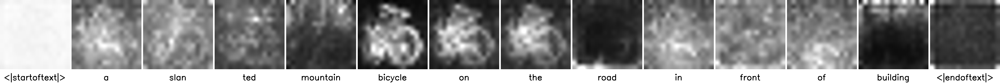


편집 계획: Rigid=2, Non-Rigid=1, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...
blend word not found!


  0%|          | 0/15 [00:00<?, ?it/s]

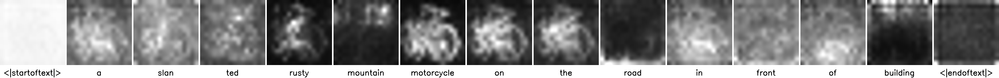

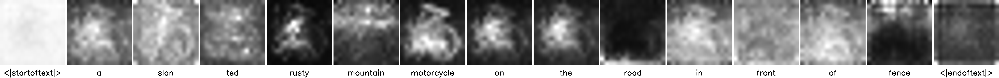

 - 원본 프롬프트: a cat sitting on a wooden chair
 - 타겟 프롬프트: a [red] [dog] [with flowers in mouth] [standing] on a [metal] chair
 - Editing: {'red': {'position': 1, 'edit_type': 6, 'action': '+'}, 'dog': {'position': 1, 'edit_type': 1, 'action': 'cat'}, 'with flowers in mouth': {'position': 2, 'edit_type': 2, 'action': '+'}, 'standing': {'position': 2, 'edit_type': 5, 'action': 'sitting'}, 'metal': {'position': 5, 'edit_type': 7, 'action': 'wooden'}}
 - Obj-Adj-Pair: {'dog': ['red', 'standing'], 'chair': ['metal'], 'flowers': []}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

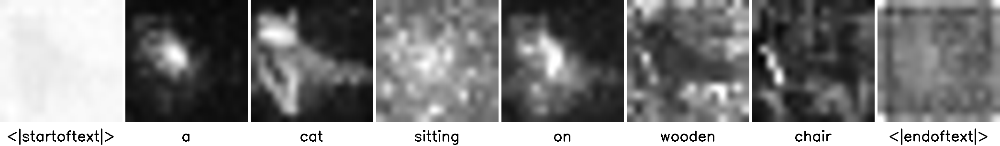


편집 계획: Rigid=1, Non-Rigid=1, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...


  0%|          | 0/15 [00:00<?, ?it/s]

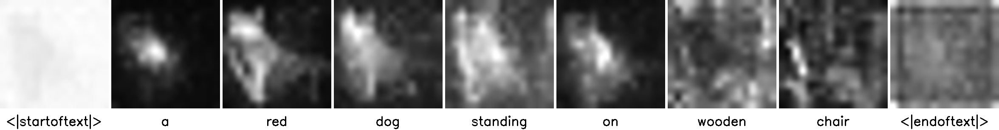

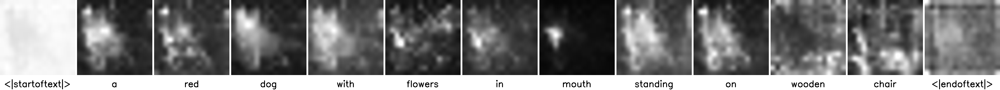

 - 원본 프롬프트: blue light, a black and white cat is playing with a flower
 - 타겟 프롬프트: blue light, a black and white [dog] is playing with a [yellow] [ball]
 - Editing: {'dog': {'position': 6, 'edit_type': 1, 'action': 'cat'}, 'yellow': {'position': 11, 'edit_type': 6, 'action': '+'}, 'ball': {'position': 12, 'edit_type': 1, 'action': 'flower'}}
 - Obj-Adj-Pair: {'dog': [], 'ball': ['yellow']}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

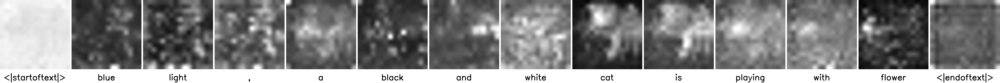


편집 계획: Rigid=2, Non-Rigid=0, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...


  0%|          | 0/15 [00:00<?, ?it/s]

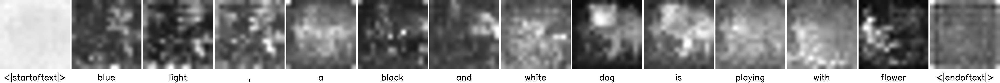

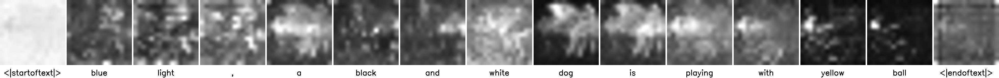

 - 원본 프롬프트: three white dumplings on brown wooden bowl
 - 타겟 프롬프트: three white [cupcakes] on [black] [metal] bowl
 - Editing: {'cupcakes': {'position': 2, 'edit_type': 1, 'action': 'dumplings'}, 'black': {'position': 4, 'edit_type': 6, 'action': 'brown'}, 'metal': {'position': 5, 'edit_type': 7, 'action': '+'}}
 - Obj-Adj-Pair: {'cupcakes': [], 'bowl': ['black', 'metal']}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

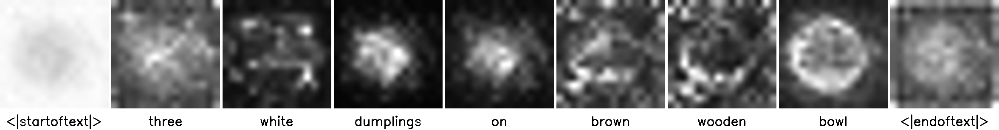


편집 계획: Rigid=1, Non-Rigid=0, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...


  0%|          | 0/15 [00:00<?, ?it/s]

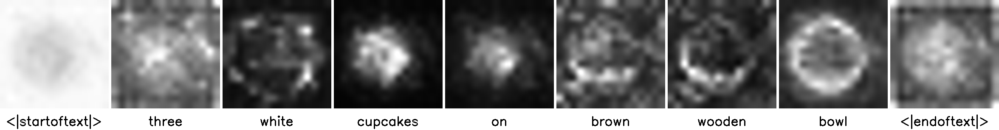

 - 원본 프롬프트: a woman with blue hair wearing a shirt
 - 타겟 프롬프트: a woman with [red] hair wearing a [coat]
 - Editing: {'red': {'position': 3, 'edit_type': 6, 'action': 'blue'}, 'coat': {'position': 7, 'edit_type': 1, 'action': 'shirt'}}
 - Obj-Adj-Pair: {'hair': ['red'], 'coat': []}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

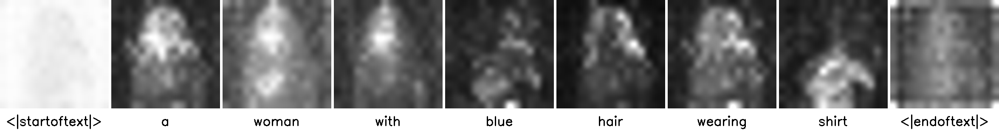


편집 계획: Rigid=1, Non-Rigid=0, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...


  0%|          | 0/15 [00:00<?, ?it/s]

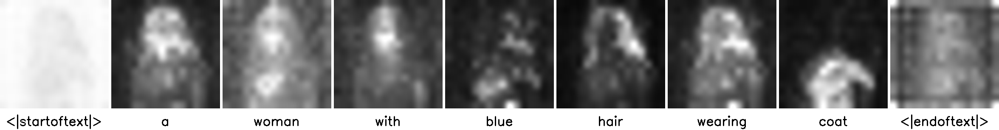

 - 원본 프롬프트: a cat sitting with beads collar
 - 타겟 프롬프트: a [orange] cat sitting with [cotton] [scarf] [putting hands up]
 - Editing: {'orange': {'position': 1, 'edit_type': 6, 'action': '+'}, 'cotton': {'position': 4, 'edit_type': 7, 'action': 'beads'}, 'scarf': {'position': 5, 'edit_type': 1, 'action': 'scarf'}, 'putting hands up': {'position': 6, 'edit_type': 5, 'action': '+'}}
 - Obj-Adj-Pair: {'cat': ['orange', 'putting hands up'], 'scarf': ['cotton']}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

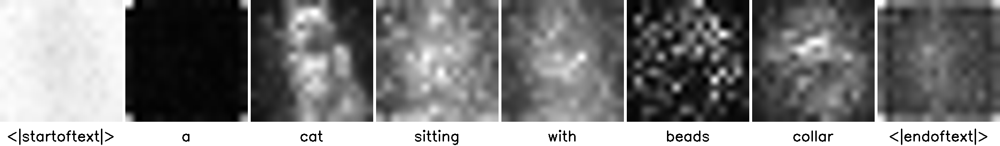


편집 계획: Rigid=1, Non-Rigid=0, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...
blend word not found!


  0%|          | 0/15 [00:00<?, ?it/s]

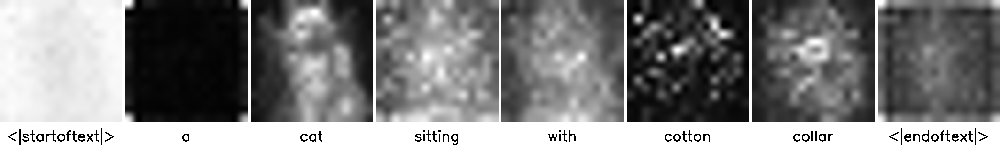

 - 원본 프롬프트: sunset over a field with clouds and a bright sky
 - 타겟 프롬프트: sunset over a field with [pink] [stars] and a [dark] sky
 - Editing: {'pink': {'position': 5, 'edit_type': 6, 'action': '+'}, 'stars': {'position': 5, 'edit_type': 1, 'action': 'clouds'}, 'dark': {'position': 8, 'edit_type': 8, 'action': 'bright'}}
 - Obj-Adj-Pair: {'stars': ['pink'], 'dark': []}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

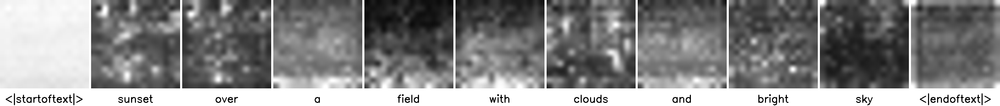


편집 계획: Rigid=2, Non-Rigid=0, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...


  0%|          | 0/15 [00:00<?, ?it/s]

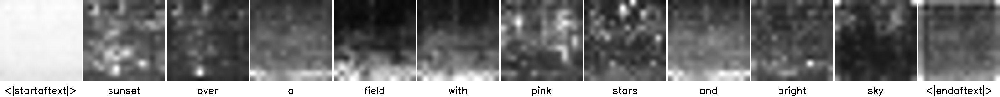

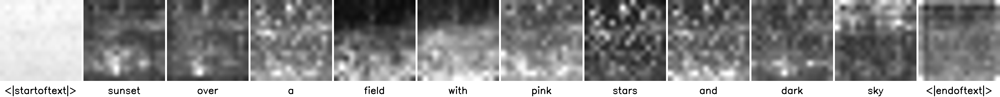

 - 원본 프롬프트: purple tulips in vase
 - 타겟 프롬프트: [yellow] [roses] in [blue] vase
 - Editing: {'yellow': {'position': 0, 'edit_type': 6, 'action': 'purple'}, 'roses': {'position': 1, 'edit_type': 1, 'action': 'tulips'}, 'blue': {'position': 3, 'edit_type': 6, 'action': '+'}}
 - Obj-Adj-Pair: {'roses': ['yellow'], 'vase': ['blue']}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

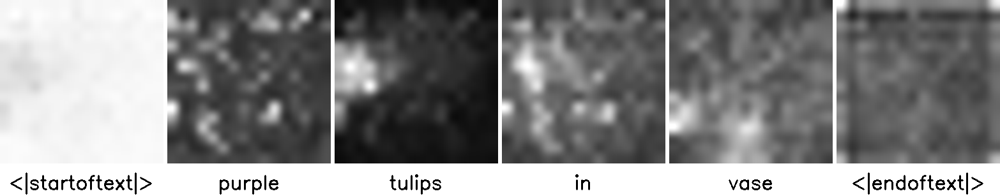


편집 계획: Rigid=1, Non-Rigid=0, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...


  0%|          | 0/15 [00:00<?, ?it/s]

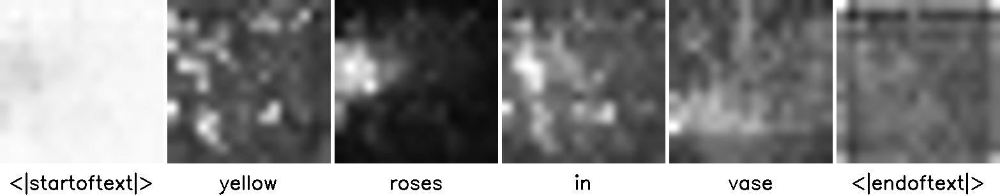

 - 원본 프롬프트: photo of horses running in the woods
 - 타겟 프롬프트: [painting] of [white] [unicorns] [standing] in the woods
 - Editing: {'painting': {'position': 0, 'edit_type': 9, 'action': 'photo'}, 'white': {'position': 2, 'edit_type': 6, 'action': '+'}, 'unicorns': {'position': 2, 'edit_type': 1, 'action': 'horses'}, 'standing': {'position': 3, 'edit_type': 5, 'action': 'running'}}
 - Obj-Adj-Pair: {'unicorns': ['white', 'standing']}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

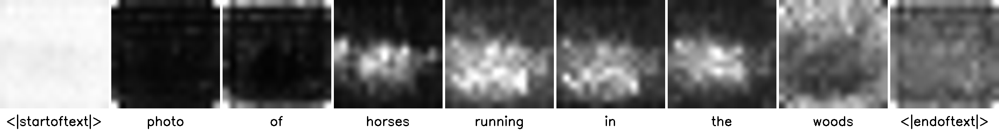


편집 계획: Rigid=1, Non-Rigid=0, Global=1
최종 이미지 생성 (ParallelEdits - 15 steps)...
blend word not found!


  0%|          | 0/15 [00:00<?, ?it/s]

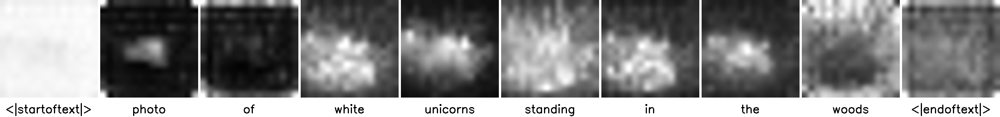

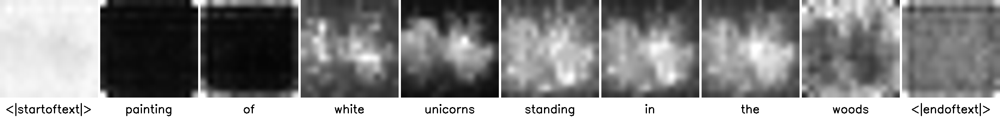

 - 원본 프롬프트: a rose on the rail
 - 타겟 프롬프트: a [white] [tulip] on the rail
 - Editing: {'white': {'position': 1, 'edit_type': 6, 'action': '+'}, 'tulip': {'position': 1, 'edit_type': 1, 'action': 'rose'}}
 - Obj-Adj-Pair: {'tulip': ['white']}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

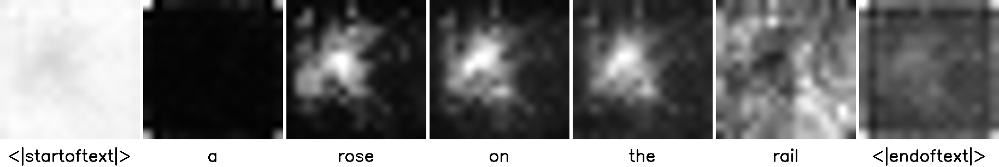


편집 계획: Rigid=1, Non-Rigid=0, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...


  0%|          | 0/15 [00:00<?, ?it/s]

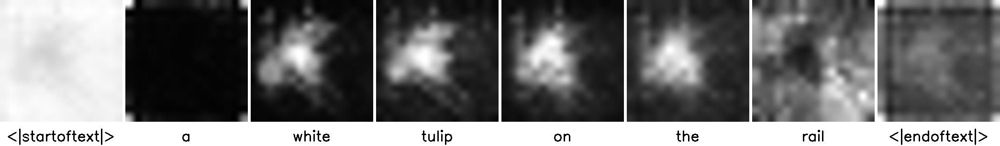

 - 원본 프롬프트: the two people are standing on rocks with a fish
 - 타겟 프롬프트: the two [old] people are [sitting] on [boat] with a fish
 - Editing: {'old': {'position': 2, 'edit_type': 4, 'action': '+'}, 'sitting': {'position': 4, 'edit_type': 5, 'action': 'standing'}, 'boat': {'position': 6, 'edit_type': 1, 'action': 'rocks'}}
 - Obj-Adj-Pair: {'people': ['old', 'sitting'], 'boat': []}

(Aspect Clustering - 5 steps)...
blend word not found!


  0%|          | 0/5 [00:00<?, ?it/s]

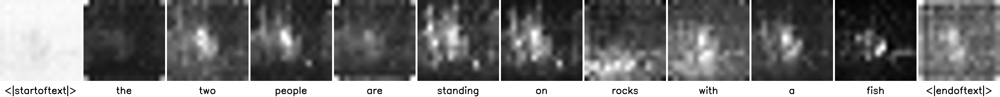


편집 계획: Rigid=1, Non-Rigid=0, Global=0
최종 이미지 생성 (ParallelEdits - 15 steps)...


  0%|          | 0/15 [00:00<?, ?it/s]

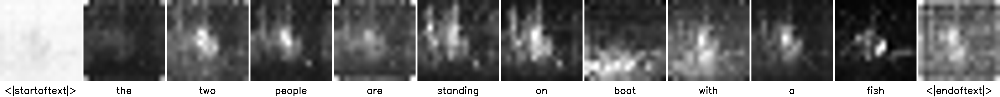


 모든 이미지 편집 작업 완료


In [ ]:
# (1) 데이터셋 로드
print("데이터셋 다운로드...")
hf_dataset = load_dataset("UB-CVML-Group/PIE_Bench_pp", "0_random_140", split="V1")

# 이미지 인덱스 지정
TARGET_INDICES = [0, 2, 3, 13, 25, 40, 48, 58, 68, 102, 135]
TARGET_WIDTH, TARGET_HEIGHT = 512, 512

# 현재 이미지 처리 순번 카운터
current_run = 0

for idx in TARGET_INDICES:
    current_run += 1
    
    # VRAM 부족 -> 루프 시작 시 캐시 비우기
    if torch.cuda.is_available():
        torch.cuda.empty_cache() 

    try:
        data_sample = hf_dataset[idx]
    except IndexError:
        print(f"❌ 인덱스 {idx}는 데이터셋 범위를 벗어납니다. 이 인덱스는 건너뜁니다.")
        continue


    image_path = f"pie_test_{idx}.jpg"
    data_sample['image'].save(image_path)

    edit_action = data_sample['edit_action']
    if isinstance(edit_action, str): edit_action = ast.literal_eval(edit_action)
    aspect_mapping = data_sample['aspect_mapping']
    if isinstance(aspect_mapping, str): aspect_mapping = ast.literal_eval(aspect_mapping)

    dataset = {
        "image_path": image_path,
        "source_prompt": data_sample['source_prompt'],
        "target_prompt": data_sample['target_prompt'],
        "editing": edit_action,
        "obj-adj-pair": aspect_mapping
    }

    # 정보 출력
    print(f" - 원본 프롬프트: {dataset['source_prompt']}")
    print(f" - 타겟 프롬프트: {dataset['target_prompt']}")
    print(f" - Editing: {dataset['editing']}")
    print(f" - Obj-Adj-Pair: {dataset['obj-adj-pair']}")

    # (2) 초기화 및 1차 분석 (Aspect Clustering)
    guidance_s = torch.tensor([1.0], device=device, dtype=DTYPE_FOR_TENSORS)
    guidance_t = torch.tensor([3.0], device=device, dtype=DTYPE_FOR_TENSORS)
    
    test_num_inference_steps, num_inference_steps = 5, 15
    
    STRENGTH = 1
    CROSS_REPLACE_STEPS = 0.7
    SELF_REPLACE_STEPS = 0.7
    THRESH_E = 0.5 
    THRESH_M = 0.8
    
    temp_target_prompt = [dataset['source_prompt']]
    temp_local = ["image"]

    img, source_prompt, target_prompt, local, mutual, positive_prompt, negative_prompt, _, _, width, height, seed, strength, cross_replace_steps, self_replace_steps, thresh_e, thresh_m, denoise = \
        dataset['image_path'], dataset['source_prompt'], temp_target_prompt, temp_local, "", "", "", test_num_inference_steps, num_inference_steps, TARGET_WIDTH, TARGET_HEIGHT, 0, STRENGTH, CROSS_REPLACE_STEPS, SELF_REPLACE_STEPS, THRESH_E, THRESH_M, False

    img_file = Image.open(img).resize((width, height))

    print("\n(Aspect Clustering - 5 steps)...")
    aspect_cluters = inference(img_file, source_prompt, target_prompt, local, mutual, positive_prompt, negative_prompt, guidance_s, guidance_t, test_num_inference_steps, width, height, seed, strength, cross_replace_steps, self_replace_steps, thresh_e, thresh_m, denoise, shape_change=[])

    # (3) 편집 계획 수립
    obj_pairs, global_edit = get_obj_pair(dataset)
    non_rigid_obj, rigid_obj, global_edit = get_edits_type(aspect_cluters, obj_pairs, global_edit)
    rigid_objs = aspect_clustering(aspect_cluters, rigid_obj)
    non_rigid_objs = aspect_clustering(aspect_cluters, non_rigid_obj)

    editing_prompts = []
    blended_word_list = []

    # Rigid Object Edits
    for obj in rigid_objs:
        editing_prompt, dataset = generate_editing_prompt(dataset, obj)
        blended_word_list.append(" ".join(obj))
        editing_prompts.append(editing_prompt)
    rigid_num = len(editing_prompts)

    # Non-Rigid Object Edits
    for obj in non_rigid_objs:
        editing_prompt, dataset = generate_editing_prompt(dataset, obj)
        blended_word_list.append(" ".join(obj))
        editing_prompts.append(editing_prompt)

    # Global Edits
    if len(global_edit) > 0:
        for obj in [global_edit]:
            editing_prompt, dataset = generate_editing_prompt(dataset, obj)
            blended_word_list.append("")
            editing_prompts.append(editing_prompt)

    print(f"\n편집 계획: Rigid={len(rigid_objs)}, Non-Rigid={len(non_rigid_objs)}, Global={len(global_edit)}")

    if not editing_prompts:
        print("편집 프롬프트가 생성되지 않음. 원본 프롬프트를 사용하여 이미지 생성만 시도.")
        target_prompt_for_denoise = [source_prompt]
        
        try:
             # Controller 없이 pipe 호출
             results = pipe(prompt=target_prompt_for_denoise, source_prompt=source_prompt, positive_prompt=positive_prompt, negative_prompt=negative_prompt, image=img_file, num_inference_steps=num_inference_steps, eta=1, strength=STRENGTH, guidance_scale=guidance_t, source_guidance_scale=guidance_s, denoise_model=denoise)
             
             final_image = results.images[-1]
             final_image.save(f"final_edited_image_{idx}.jpg")
             print(f"{idx}번째 이미지 작업 완료 (편집 없음).")
        except Exception as e:
             print(f"{idx}번째 이미지 처리 중 오류 발생 (편집 없음 시도): {e}")
             
        continue
    
    # (4) 최종 실행
    print(f"최종 이미지 생성 (ParallelEdits - {num_inference_steps} steps)...")
    shape_change_indices = list(range(rigid_num, len(editing_prompts)))

    for i in range(rigid_num):
        src_len = len(source_prompt.split())
        if i < len(editing_prompts):
            tgt_len = len(editing_prompts[i].split())
            if src_len != tgt_len:
                if i not in shape_change_indices: shape_change_indices.append(i)
    shape_change_indices.sort()
    
    final_target_prompt = editing_prompts
    
    results = inference(img_file, source_prompt, final_target_prompt, blended_word_list, mutual, positive_prompt, negative_prompt, guidance_s, guidance_t, num_inference_steps, width, height, seed, STRENGTH, CROSS_REPLACE_STEPS, SELF_REPLACE_STEPS, THRESH_E, THRESH_M, denoise, shape_change=shape_change_indices)

    final_image = results[0]['target_image'][-1]
    
    final_image.save(f"sd15_{idx}.jpg")

print("\n 모든 이미지 편집 작업 완료")